# Problem 1: Linear Regression
## The comp-activ databases is a collection of a computer systems activity measures .
## The data was collected from a Sun Sparcstation 20/712 with 128 Mbytes of memory running in a multi-user university department. Users would typically be doing a large variety of tasks ranging from accessing the internet, editing files or running very cpu-bound programs.
## As you are a budding data scientist you thought to find out a linear equation to build a model to predict 'usr'(Portion of time (%) that cpus run in user mode) and to find out how each attribute affects the system to be in 'usr' mode using a list of system attributes.

## Question 1.1 Read the data and do exploratory data analysis. Describe the data briefly. (Check the Data types, shape, EDA, 5 point summary) Perform Univariate, Bivariate Analysis, Multivariate Analysis

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import matplotlib.style
from sklearn import metrics
from sklearn.linear_model import LinearRegression

### **Read the dataset**

In [ ]:
path = "/content/compactiv.xlsx"
df = pd.read_excel(path)

### **EDA**

In [ ]:
df.head(5)

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgscan,atch,pgin,ppgin,pflt,vflt,runqsz,freemem,freeswap,usr
0,1,0,2147,79,68,0.2,0.2,40671.0,53995.0,0.0,...,0.0,0.0,1.6,2.6,16.00,26.40,CPU_Bound,4670,1730946,95
1,0,0,170,18,21,0.2,0.2,448.0,8385.0,0.0,...,0.0,0.0,0.0,0.0,15.63,16.83,Not_CPU_Bound,7278,1869002,97
2,15,3,2162,159,119,2.0,2.4,NaN,31950.0,0.0,...,0.0,1.2,6.0,9.4,150.20,220.20,Not_CPU_Bound,702,1021237,87
3,0,0,160,12,16,0.2,0.2,NaN,8670.0,0.0,...,0.0,0.0,0.2,0.2,15.60,16.80,Not_CPU_Bound,7248,1863704,98
4,5,1,330,39,38,0.4,0.4,NaN,12185.0,0.0,...,0.0,0.0,1.0,1.2,37.80,47.60,Not_CPU_Bound,633,1760253,90


In [ ]:
df.shape

(8192, 22)

## The dataset has 8192 rows and 22 columns

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8192 entries, 0 to 8191
Data columns (total 22 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   lread     8192 non-null   int64  
 1   lwrite    8192 non-null   int64  
 2   scall     8192 non-null   int64  
 3   sread     8192 non-null   int64  
 4   swrite    8192 non-null   int64  
 5   fork      8192 non-null   float64
 6   exec      8192 non-null   float64
 7   rchar     8088 non-null   float64
 8   wchar     8177 non-null   float64
 9   pgout     8192 non-null   float64
 10  ppgout    8192 non-null   float64
 11  pgfree    8192 non-null   float64
 12  pgscan    8192 non-null   float64
 13  atch      8192 non-null   float64
 14  pgin      8192 non-null   float64
 15  ppgin     8192 non-null   float64
 16  pflt      8192 non-null   float64
 17  vflt      8192 non-null   float64
 18  runqsz    8192 non-null   object 
 19  freemem   8192 non-null   int64  
 20  freeswap  8192 non-null   int6

In [ ]:
df.isnull().sum()

lread         0
lwrite        0
scall         0
sread         0
swrite        0
fork          0
exec          0
rchar       104
wchar        15
pgout         0
ppgout        0
pgfree        0
pgscan        0
atch          0
pgin          0
ppgin         0
pflt          0
vflt          0
runqsz        0
freemem       0
freeswap      0
usr           0
dtype: int64

## The dataset has 13 float datatypes, 8 int values and 1 object datatype
## We can clearly see that the columns "rchar" and "wchar" has missing vales

In [ ]:
df.describe(include="all").T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
lread,8192.0,NaN,NaN,NaN,19.559692,53.353799,0.0,2.0,7.0,20.0,1845.0
lwrite,8192.0,NaN,NaN,NaN,13.106201,29.891726,0.0,0.0,1.0,10.0,575.0
scall,8192.0,NaN,NaN,NaN,2306.318237,1633.617322,109.0,1012.0,2051.5,3317.25,12493.0
sread,8192.0,NaN,NaN,NaN,210.47998,198.980146,6.0,86.0,166.0,279.0,5318.0
swrite,8192.0,NaN,NaN,NaN,150.058228,160.47898,7.0,63.0,117.0,185.0,5456.0
fork,8192.0,NaN,NaN,NaN,1.884554,2.479493,0.0,0.4,0.8,2.2,20.12
exec,8192.0,NaN,NaN,NaN,2.791998,5.212456,0.0,0.2,1.2,2.8,59.56
rchar,8088.0,NaN,NaN,NaN,197385.728363,239837.493526,278.0,34091.5,125473.5,267828.75,2526649.0
wchar,8177.0,NaN,NaN,NaN,95902.992785,140841.707911,1498.0,22916.0,46619.0,106101.0,1801623.0
pgout,8192.0,NaN,NaN,NaN,2.285317,5.307038,0.0,0.0,0.0,2.4,81.44


## **Unique values for all categorical variables**

In [ ]:
for column in df.columns:
    if df[column].dtype == 'object':
        print(column.upper(),': ',df[column].nunique())
        print(df[column].value_counts().sort_values())
        print('\n')

RUNQSZ :  2
CPU_Bound        3861
Not_CPU_Bound    4331
Name: runqsz, dtype: int64




##The dataset has more number of non CPU bound than CPU bound, so the record is more bound towards "Not CPU bound"

## Converting categorical variables to dummy variables

In [ ]:
df = pd.get_dummies(df, columns=['runqsz'], drop_first=True)

In [ ]:
df.head(5)

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgscan,atch,pgin,ppgin,pflt,vflt,freemem,freeswap,usr,runqsz_Not_CPU_Bound
0,1,0,2147,79,68,0.2,0.2,40671.0,53995.0,0.0,...,0.0,0.0,1.6,2.6,16.00,26.40,4670,1730946,95,0
1,0,0,170,18,21,0.2,0.2,448.0,8385.0,0.0,...,0.0,0.0,0.0,0.0,15.63,16.83,7278,1869002,97,1
2,15,3,2162,159,119,2.0,2.4,NaN,31950.0,0.0,...,0.0,1.2,6.0,9.4,150.20,220.20,702,1021237,87,1
3,0,0,160,12,16,0.2,0.2,NaN,8670.0,0.0,...,0.0,0.0,0.2,0.2,15.60,16.80,7248,1863704,98,1
4,5,1,330,39,38,0.4,0.4,NaN,12185.0,0.0,...,0.0,0.0,1.0,1.2,37.80,47.60,633,1760253,90,1


## Bivarient analysis by using heatmap

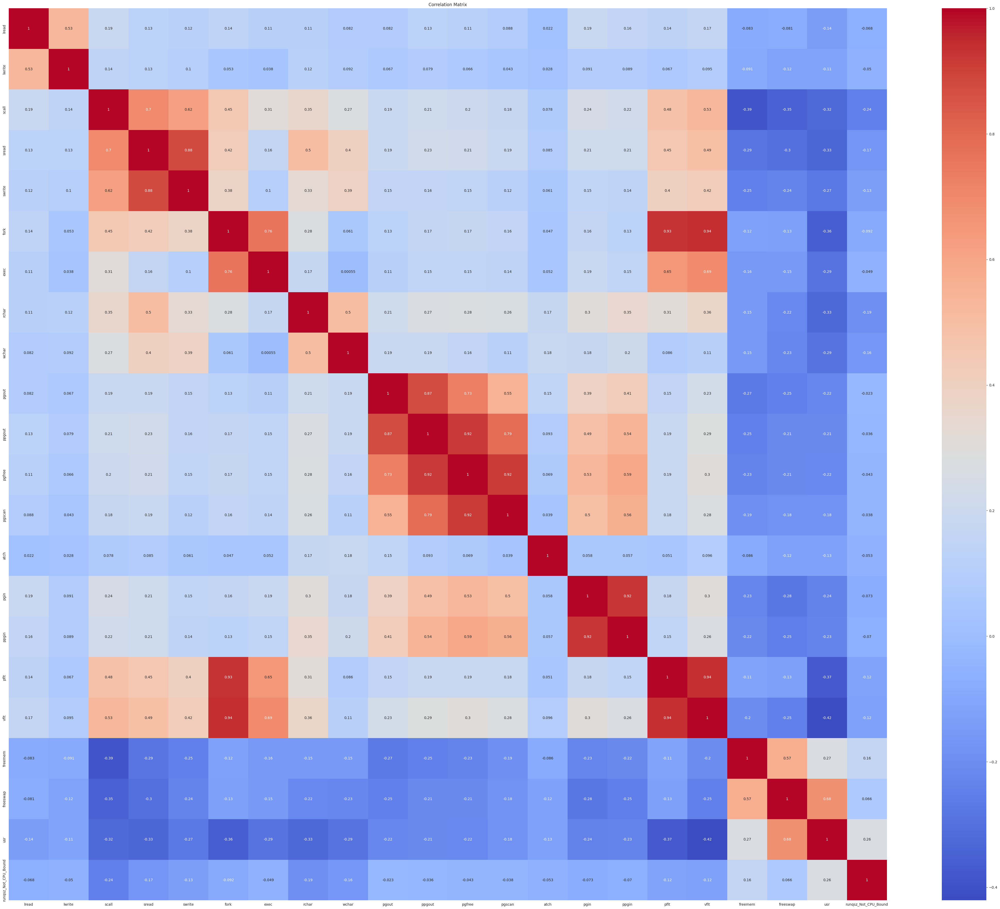

In [ ]:
correlation_matrix = df.corr()
plt.figure(figsize=(55, 45))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm")
plt.title("Correlation Matrix")
plt.show()

## From the Heatmap we found the bivarient analysis bewteen the variables.
## There are correlations between many varibles from the heatmap,
## The following pair of variables have corrilation between them
### 1)Iread and Iwrite, 2) Scall and Sread, 3) scall and Swrite, 4) Scall and Vfit, 5) Sread and Swrite, 6) sread and rchar, 7) Sread and Vfit, 8) fork and exec, 9) fork and pfit, 10) fork and vfit, 11) exec and pfit, 12) exec and vfit, 13) rchar and wchar, 14) pgout and ppgout, 15) pgout and pgfree, 16) pgout and pgscan, 17) ppgout and pgfree, 18) ppgout and pgscan, 19) ppgout and ppgin, 20)pgfree and pgscan, 21) pgfree and pgin, 22)pgfree and ppgin 23)pgscan adn pgin, 24)pgscan and ppgin, 25)pgin and ppgin, 26)pfit and fork, 27)pfit and exec 28)pfit and vfit, 29)vfit and fork, 30)vfit and exec 31)freeman and freeswap, 32)freeswap and usr


## Here we perform multivarient analysis by using pairplot

<Figure size 4000x2000 with 0 Axes>

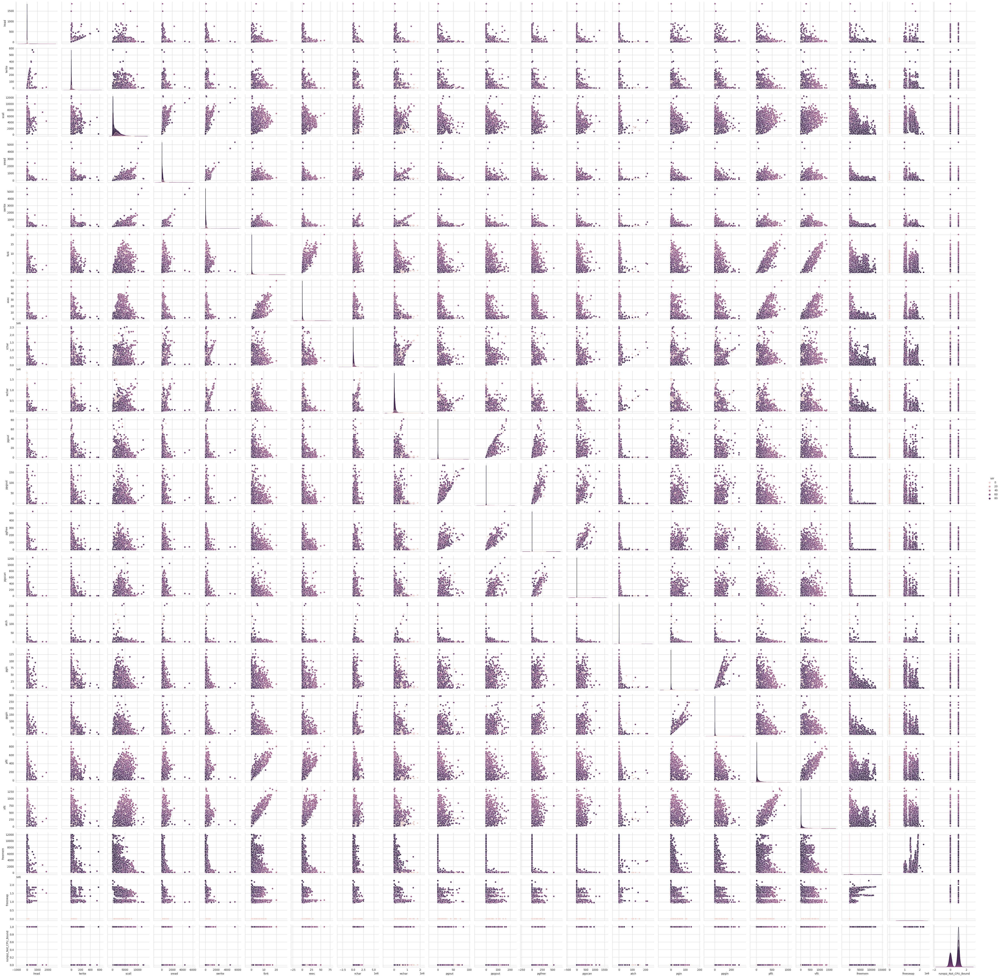

In [ ]:
plt.figure(figsize=(40, 20))
sns.pairplot(df, hue="usr")
plt.show()

## **Question 1.2 Impute null values if present, also check for the values which are equal to zero. Do they have any meaning or do we need to change them or drop them? Check for the possibility of creating new features if required. Also check for outliers and duplicates if there.**

## **for** **null** **values**
## **Handling missing values, zeros, outliers, and duplicates in a dataset is an important part of data preprocessing and analysis**

In [ ]:
import pandas as pd
import numpy as np
path = "/content/compactiv.xlsx"
df = pd.read_excel(path)
missing_values = df.isnull().sum()
print("Missing Values:\n", missing_values)

Missing Values:
 lread         0
lwrite        0
scall         0
sread         0
swrite        0
fork          0
exec          0
rchar       104
wchar        15
pgout         0
ppgout        0
pgfree        0
pgscan        0
atch          0
pgin          0
ppgin         0
pflt          0
vflt          0
runqsz        0
freemem       0
freeswap      0
usr           0
dtype: int64


## From the output we can see that "rchar" and "wchar" have null values
## We can treat null values by replaces them with the mean values of that particular column

In [ ]:
df.fillna(df.mean(), inplace=True)

<ipython-input-68-bf934754a5b1>:1: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  df.fillna(df.mean(), inplace=True)


In [ ]:
df.head(5)

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgscan,atch,pgin,ppgin,pflt,vflt,runqsz,freemem,freeswap,usr
0,1,0,2147,79,68,0.2,0.2,40671.000000,53995.0,0.0,...,0.0,0.0,1.6,2.6,16.00,26.40,CPU_Bound,4670,1730946,95
1,0,0,170,18,21,0.2,0.2,448.000000,8385.0,0.0,...,0.0,0.0,0.0,0.0,15.63,16.83,Not_CPU_Bound,7278,1869002,97
2,15,3,2162,159,119,2.0,2.4,197385.728363,31950.0,0.0,...,0.0,1.2,6.0,9.4,150.20,220.20,Not_CPU_Bound,702,1021237,87
3,0,0,160,12,16,0.2,0.2,197385.728363,8670.0,0.0,...,0.0,0.0,0.2,0.2,15.60,16.80,Not_CPU_Bound,7248,1863704,98
4,5,1,330,39,38,0.4,0.4,197385.728363,12185.0,0.0,...,0.0,0.0,1.0,1.2,37.80,47.60,Not_CPU_Bound,633,1760253,90


In [ ]:
df.describe()

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgfree,pgscan,atch,pgin,ppgin,pflt,vflt,freemem,freeswap,usr
count,8192.000000,8192.000000,8192.000000,8192.000000,8192.000000,8192.000000,8192.000000,8.192000e+03,8.192000e+03,8192.000000,...,8192.000000,8192.000000,8192.000000,8192.000000,8192.000000,8192.000000,8192.000000,8192.000000,8.192000e+03,8192.000000
mean,19.559692,13.106201,2306.318237,210.479980,150.058228,1.884554,2.791998,1.973857e+05,9.590299e+04,2.285317,...,11.919712,21.526849,1.127505,8.277960,12.388586,109.793799,185.315796,1763.456299,1.328126e+06,83.968872
std,53.353799,29.891726,1633.617322,198.980146,160.478980,2.479493,5.212456,2.383100e+05,1.407127e+05,5.307038,...,32.363520,71.141340,5.708347,13.874978,22.281318,114.419221,191.000603,2482.104511,4.220194e+05,18.401905
min,0.000000,0.000000,109.000000,6.000000,7.000000,0.000000,0.000000,2.780000e+02,1.498000e+03,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.200000,55.000000,2.000000e+00,0.000000
25%,2.000000,0.000000,1012.000000,86.000000,63.000000,0.400000,0.200000,3.486050e+04,2.297775e+04,0.000000,...,0.000000,0.000000,0.000000,0.600000,0.600000,25.000000,45.400000,231.000000,1.042624e+06,81.000000
50%,7.000000,1.000000,2051.500000,166.000000,117.000000,0.800000,1.200000,1.278250e+05,4.665300e+04,0.000000,...,0.000000,0.000000,0.000000,2.800000,3.800000,63.800000,120.400000,579.000000,1.289290e+06,89.000000
75%,20.000000,10.000000,3317.250000,279.000000,185.000000,2.200000,2.800000,2.653948e+05,1.060370e+05,2.400000,...,5.000000,0.000000,0.600000,9.765000,13.800000,159.600000,251.800000,2002.250000,1.730380e+06,94.000000
max,1845.000000,575.000000,12493.000000,5318.000000,5456.000000,20.120000,59.560000,2.526649e+06,1.801623e+06,81.440000,...,523.000000,1237.000000,211.580000,141.200000,292.610000,899.800000,1365.000000,12027.000000,2.243187e+06,99.000000


In [ ]:
missing_values = df.isnull().sum()
print("Missing Values:\n", missing_values)

Missing Values:
 lread       0
lwrite      0
scall       0
sread       0
swrite      0
fork        0
exec        0
rchar       0
wchar       0
pgout       0
ppgout      0
pgfree      0
pgscan      0
atch        0
pgin        0
ppgin       0
pflt        0
vflt        0
runqsz      0
freemem     0
freeswap    0
usr         0
dtype: int64


## **We have checked for null values and treated them**

## Check for zero values

In [ ]:
zero_values = (df == 0).sum()
print("Zero Values:\n", zero_values)

Zero Values:
 lread        675
lwrite      2684
scall          0
sread          0
swrite         0
fork          21
exec          21
rchar          0
wchar          0
pgout       4878
ppgout      4878
pgfree      4869
pgscan      6448
atch        4575
pgin        1220
ppgin       1220
pflt           3
vflt           0
runqsz         0
freemem        0
freeswap       0
usr          283
dtype: int64


## The columns lread, lwrite, fork, exec, pgout, ppgout, pgfree, pgscan, atch, pgin, ppgin, pflt, usr have zero values
## Only a domain expert can confirm if we can remove the zero values or not
## In this case we cannot remove the zeros as it can mean that there was no action at that time or no usage of CPU's at that time. So, in my opinion they should be ignored

## Check for duplicate values

In [ ]:
duplicates = df.duplicated().sum()
print("Duplicate Rows:", duplicates)

Duplicate Rows: 0


## There are no duplicate values in the dataset

## Check for outliers

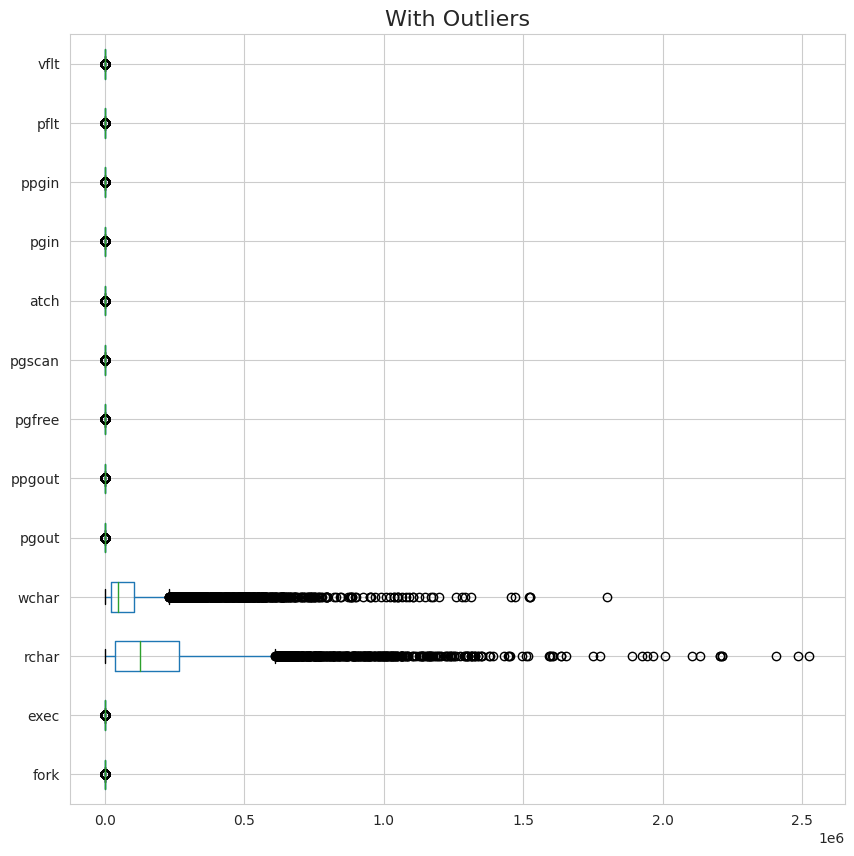

In [ ]:
cont=df.dtypes[(df.dtypes!='int64') & (df.dtypes!='object')].index
plt.figure(figsize=(10,10))
df[cont].boxplot(vert=0)
plt.title('With Outliers',fontsize=16)
plt.show()

In [ ]:
def remove_outlier(col):
    sorted(col)
    Q1,Q3=np.percentile(col,[25,75])
    IQR=Q3-Q1
    lower_range= Q1-(1.5 * IQR)
    upper_range= Q3+(1.5 * IQR)
    return lower_range, upper_range

In [ ]:
for column in df[cont].columns:
    lr,ur=remove_outlier(df[column])
    df[column]=np.where(df[column]>ur,ur,df[column])
    df[column]=np.where(df[column]<lr,lr,df[column])

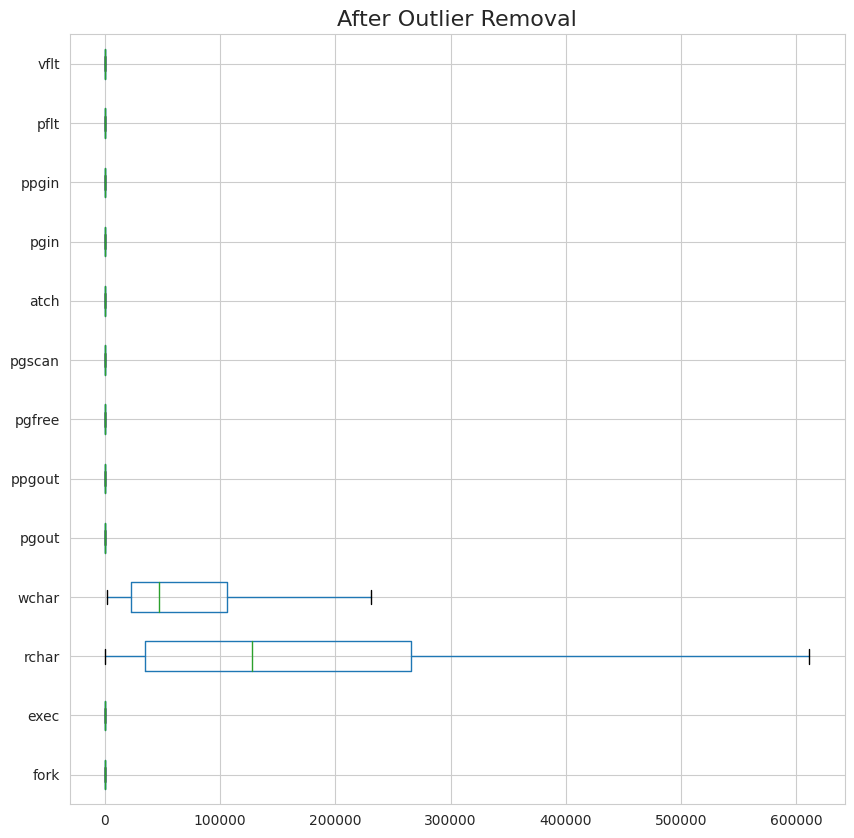

In [ ]:
plt.figure(figsize=(10,10))
df[cont].boxplot(vert=0)
plt.title('After Outlier Removal',fontsize=16)
plt.show()

## **Data Distribution**

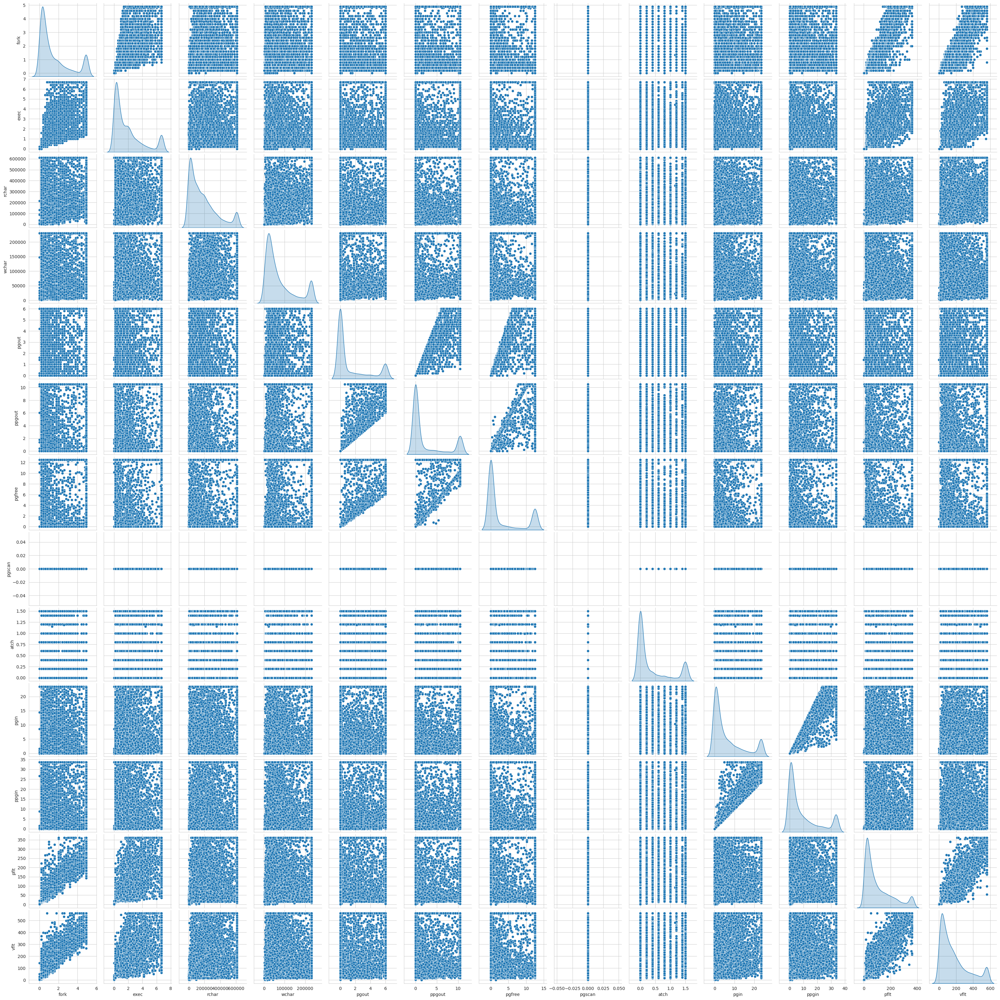

In [ ]:
df_attr = (df[cont])
sns.pairplot(df_attr, diag_kind='kde')
plt.show()

The pair plot shows that All are scatterd equally and well distributed, we can not distinguish the collinearity between each variables.  

## Question 1.3 Encode the data (having string values) for Modelling. Split the data into train and test (70:30). Apply Linear regression using scikit learn. Perform checks for significant variables using appropriate method from statsmodel. Create multiple models and check the performance of Predictions on Train and Test sets using Rsquare, RMSE & Adj Rsquare. Compare these models and select the best one with appropriate reasoning.

### **Linear Regression using statsmodel(ols)**

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error
import statsmodels.api as sm
df = pd.get_dummies(df, columns=['runqsz'], drop_first=True)

In [ ]:
# Split the data into train and test (70:30 split)
X = df.drop('usr', axis=1)
y = df['usr']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

lr = LinearRegression()
lr.fit(X_train, y_train)

y_train_pred = lr.predict(X_train)
y_test_pred = lr.predict(X_test)

# Calculate R-squared for train and test sets
train_r2 = r2_score(y_train, y_train_pred)
test_r2 = r2_score(y_test, y_test_pred)
print("Train R-squared:", train_r2)
print("Test R-squared:", test_r2)

# Calculate RMSE for train and test sets
train_rmse = np.sqrt(mean_squared_error(y_train, y_train_pred))
test_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred))
print("Train RMSE:", train_rmse)
print("Test RMSE:", test_rmse)

# Check variable significance using statsmodels
X_train_sm = sm.add_constant(X_train)
model = sm.OLS(y_train, X_train_sm).fit()
print(model.summary())

# Calculate Adjusted R-squared
n = X_train.shape[0]
k = X_train.shape[1] - 1
adj_r2 = 1 - (1 - train_r2) * (n - 1) / (n - k - 1)
print("Adjusted R-squared:", adj_r2)

Train R-squared: 0.6262376102578355
Test R-squared: 0.6243847491224064
Train RMSE: 11.136857615216798
Test RMSE: 11.536445909542527
                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.626
Model:                            OLS   Adj. R-squared:                  0.625
Method:                 Least Squares   F-statistic:                     478.6
Date:                Sun, 05 Nov 2023   Prob (F-statistic):               0.00
Time:                        15:00:59   Log-Likelihood:                -21957.
No. Observations:                5734   AIC:                         4.396e+04
Df Residuals:                    5713   BIC:                         4.409e+04
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025  

## We train and test to check how the model is performing, To do the train and test what the Machine Learning technique does is, for example if we have 100 records, we take 75 records to train the keep the 25 records to test and check the performanace of the model
##1) From the model summary we found the value of R-square as 0.626, that means we have ±60% tolerance in the predictions, it also means that after we fit the model and run the variation between the observed and the predicted value is 60%
## 2)Adjusted R² is almost same as the R² value so there is not much to be interpreted from the adjusted R²
## F-statistics is 478.6 from the output
## The confidence interval rangers from 41.564(0.25 quartile) to 44.585(0.95 quartile)





## **Check for Multicolliearity in the model by using VIF**

In [ ]:
# let's check the VIF of the predictors
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif_series1 = pd.Series(
    [variance_inflation_factor(X_train.values, i) for i in range(X_train.shape[1])],
    index=X_train.columns,
)
print("VIF values: \n\n{}\n".format(vif_series1))

/usr/local/lib/python3.10/dist-packages/statsmodels/regression/linear_model.py:1783: RuntimeWarning: invalid value encountered in double_scalars
  return 1 - self.ssr/self.uncentered_tss


VIF values: 

lread                    1.572880
lwrite                   1.636626
scall                    6.890607
sread                   14.169838
swrite                   9.589174
fork                    24.991367
exec                     5.581894
rchar                    4.022457
wchar                    3.083217
pgout                   15.813250
ppgout                  43.225531
pgfree                  24.427290
pgscan                        NaN
atch                     2.674301
pgin                    24.383498
ppgin                   24.408403
pflt                    24.293408
vflt                    32.231130
freemem                  2.604692
freeswap                 5.946293
runqsz_Not_CPU_Bound     2.158368
dtype: float64



## As few predictors have higher VIF value that means that there is multicollinearity in the data.
## We remove the columns which have higher VIF as they show multicollinearity and drop the ones which have least impact on the R-square and adj R-square  

In [ ]:
X_train.columns

Index(['lread', 'lwrite', 'scall', 'sread', 'swrite', 'fork', 'exec', 'rchar',
       'wchar', 'pgout', 'ppgout', 'pgfree', 'pgscan', 'atch', 'pgin', 'ppgin',
       'pflt', 'vflt', 'freemem', 'freeswap', 'runqsz_Not_CPU_Bound'],
      dtype='object')

In [ ]:
X_train2 = X_train.drop(["ppgout"], axis=1)
olsmod_1 = sm.OLS(y_train, X_train2)
olsres_1 = olsmod_1.fit()
print(
    "R-squared:",
    np.round(olsres_1.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(olsres_1.rsquared_adj, 3),
)

R-squared: 0.974 
Adjusted R-squared: 0.974


In [ ]:
X_train3 = X_train.drop(["vflt"], axis=1)
olsmod_2 = sm.OLS(y_train, X_train3)
olsres_2 = olsmod_1.fit()
print(
    "R-squared:",
    np.round(olsres_2.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(olsres_2.rsquared_adj, 3),
)

R-squared: 0.974 
Adjusted R-squared: 0.974


In [ ]:
X_train4 = X_train.drop(["fork"], axis=1)
olsmod_3 = sm.OLS(y_train, X_train4)
olsres_3 = olsmod_1.fit()
print(
    "R-squared:",
    np.round(olsres_3.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(olsres_3.rsquared_adj, 3),
)

R-squared: 0.974 
Adjusted R-squared: 0.974


In [ ]:
X_train5 = X_train.drop(["pgfree"], axis=1)
olsmod_4 = sm.OLS(y_train, X_train5)
olsres_4 = olsmod_1.fit()
print(
    "R-squared:",
    np.round(olsres_4.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(olsres_4.rsquared_adj, 3),
)

R-squared: 0.974 
Adjusted R-squared: 0.974


In [ ]:
X_train6 = X_train.drop(["pgin"], axis=1)
olsmod_5 = sm.OLS(y_train, X_train6)
olsres_5 = olsmod_1.fit()
print(
    "R-squared:",
    np.round(olsres_5.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(olsres_5.rsquared_adj, 3),
)

R-squared: 0.974 
Adjusted R-squared: 0.974


In [ ]:
X_train7 = X_train.drop(["ppgin"], axis=1)
olsmod_6 = sm.OLS(y_train, X_train7)
olsres_6 = olsmod_1.fit()
print(
    "R-squared:",
    np.round(olsres_6.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(olsres_6.rsquared_adj, 3),
)

R-squared: 0.974 
Adjusted R-squared: 0.974


In [ ]:
X_train8 = X_train.drop(["pflt"], axis=1)
olsmod_7 = sm.OLS(y_train, X_train8)
olsres_7 = olsmod_1.fit()
print(
    "R-squared:",
    np.round(olsres_7.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(olsres_7.rsquared_adj, 3),
)

R-squared: 0.974 
Adjusted R-squared: 0.974


In [ ]:
X_train9 = X_train.drop(["pgout"], axis=1)
olsmod_8 = sm.OLS(y_train, X_train9)
olsres_8 = olsmod_1.fit()
print(
    "R-squared:",
    np.round(olsres_8.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(olsres_8.rsquared_adj, 3),
)

R-squared: 0.974 
Adjusted R-squared: 0.974


In [ ]:
X_train11 = X_train.drop(["scall"], axis=1)
olsmod_10= sm.OLS(y_train, X_train11)
olsres_10= olsmod_1.fit()
print(
    "R-squared:",
    np.round(olsres_10.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(olsres_10.rsquared_adj, 3),
)

R-squared: 0.974 
Adjusted R-squared: 0.974



# The R-squared and Adjusted R-squared value does not change at all, so that means that the above columns are not of any use and can be dropped.

In [ ]:
# let's check the VIF of the predictors
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif_series1 = pd.Series(
    [variance_inflation_factor(X_train.values, i) for i in range(X_train.shape[1])],
    index=X_train.columns,
)
print("VIF values: \n\n{}\n".format(vif_series1))

VIF values: 

lread                    1.572880
lwrite                   1.636626
scall                    6.890607
sread                   14.169838
swrite                   9.589174
fork                    24.991367
exec                     5.581894
rchar                    4.022457
wchar                    3.083217
pgout                   15.813250
ppgout                  43.225531
pgfree                  24.427290
pgscan                        NaN
atch                     2.674301
pgin                    24.383498
ppgin                   24.408403
pflt                    24.293408
vflt                    32.231130
freemem                  2.604692
freeswap                 5.946293
runqsz_Not_CPU_Bound     2.158368
dtype: float64



/usr/local/lib/python3.10/dist-packages/statsmodels/regression/linear_model.py:1783: RuntimeWarning: invalid value encountered in double_scalars
  return 1 - self.ssr/self.uncentered_tss


## *Clearly we can see the VIF value of sread, rchar, wchar, vfit and pfit has reduced *
## After dropping the features causing strong multicollinearity and the statistically insignificant ones, our model performance hasn't dropped sharply . This shows that these variables did not have much predictive power.

In [ ]:
print(olsres_10.summary())

                                 OLS Regression Results                                
Dep. Variable:                    usr   R-squared (uncentered):                   0.974
Model:                            OLS   Adj. R-squared (uncentered):              0.974
Method:                 Least Squares   F-statistic:                          1.125e+04
Date:                Sun, 05 Nov 2023   Prob (F-statistic):                        0.00
Time:                        15:01:01   Log-Likelihood:                         -23214.
No. Observations:                5734   AIC:                                  4.647e+04
Df Residuals:                    5715   BIC:                                  4.659e+04
Df Model:                          19                                                  
Covariance Type:            nonrobust                                                  
                           coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------

## Now as observed from thee predictors the P-value of exec is > 0.05 level of significance so we remove that built the model

In [ ]:
X_train12 = X_train.drop(["exec"], axis=1)
olsmod_11= sm.OLS(y_train, X_train12)
olsres_11= olsmod_1.fit()

In [ ]:
print(olsres_11.summary())

                                 OLS Regression Results                                
Dep. Variable:                    usr   R-squared (uncentered):                   0.974
Model:                            OLS   Adj. R-squared (uncentered):              0.974
Method:                 Least Squares   F-statistic:                          1.125e+04
Date:                Sun, 05 Nov 2023   Prob (F-statistic):                        0.00
Time:                        15:01:01   Log-Likelihood:                         -23214.
No. Observations:                5734   AIC:                                  4.647e+04
Df Residuals:                    5715   BIC:                                  4.659e+04
Df Model:                          19                                                  
Covariance Type:            nonrobust                                                  
                           coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------

# Testing the Assumptions of Linear Regression
## For Linear Regression, we need to check if the following assumptions hold:-

### 1)Linearity
### 2)Independence
### 3)Homoscedasticity
### 4)Normality of error terms
### 5)No strong Multicollinearity

## Linearity and Independence of predictors

In [ ]:
df_pred = pd.DataFrame()
df_pred["Actual Values"] = y_train.values.flatten()
df_pred["Fitted Values"] = olsres_11.fittedvalues.values
df_pred["Residuals"] = olsres_11.resid.values
df_pred.head()

,Actual Values,Fitted Values,Residuals
0,81,100.885154,-19.885154
1,93,77.560699,15.439301
2,64,63.180044,0.819956
3,86,90.956893,-4.956893
4,94,112.544361,-18.544361


<function matplotlib.pyplot.show(close=None, block=None)>

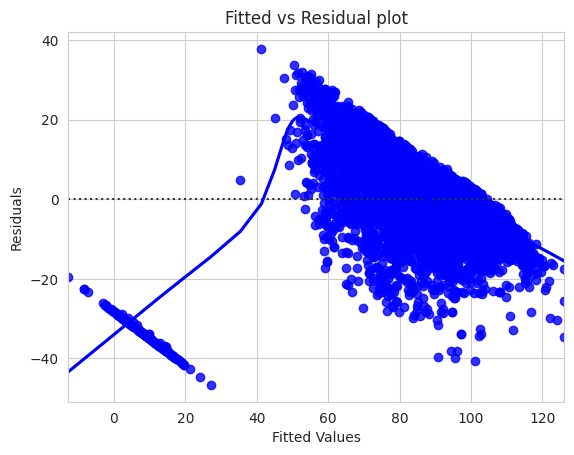

In [ ]:
sns.set_style("whitegrid")
sns.residplot(
    data=df_pred, x="Fitted Values", y="Residuals", color="blue", lowess=True
)
plt.xlabel("Fitted Values")
plt.ylabel("Residuals")
plt.title("Fitted vs Residual plot")
plt.show

## The plot above shows that the varience is not uniform
## as the fitted values increases the residuals also increase except only in one case from 0-20 value of fitted value the residual value are dropping but from 30-120 range of fitted value the redidual value also inreases




## Test for Normality

In [ ]:
import scipy.stats as stats

In [ ]:
stats.shapiro(df_pred["Residuals"])

/usr/local/lib/python3.10/dist-packages/scipy/stats/_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


ShapiroResult(statistic=0.9934343695640564, pvalue=1.3342254403286478e-15)

### **here as p-value is > 0.05, the residuals are normal according to shapiro test**

## Test for Homoscedasticity

In [ ]:
import statsmodels.stats.api as sms
sms.het_goldfeldquandt(df_pred["Residuals"], X_train11)[1]

0.9643898365671506

##Since the p0-value is > 0.05 we can say that the residulas are homoscendastic.

## The model built olsmod_11 satisfies all assumptions of Linear Regression
## The model equation will be as follows:

In [ ]:
olsres_11.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:                    usr   R-squared (uncentered):                   0.974
Model:                            OLS   Adj. R-squared (uncentered):              0.974
Method:                 Least Squares   F-statistic:                          1.125e+04
Date:                Sun, 05 Nov 2023   Prob (F-statistic):                        0.00
Time:                        15:01:04   Log-Likelihood:                         -23214.
No. Observations:                5734   AIC:                                  4.647e+04
Df Residuals:                    5715   BIC:                                  4.659e+04
Df Model:                          19                                                  
Covariance Type:            nonrobust                                                  
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
lread                   -0.0289      0.004     -7.265      0.000      -0.037      -0.021
lwrite                   0.0318      0.008      4.222      0.000       0.017       0.047
scall                    0.0030      0.000     17.479      0.000       0.003       0.003
sread                    0.0068      0.002      2.904      0.004       0.002       0.011
swrite                  -0.0101      0.003     -3.989      0.000      -0.015      -0.005
fork                    -2.5061      0.409     -6.127      0.000      -3.308      -1.704
exec                     0.1996      0.153      1.307      0.191      -0.100       0.499
rchar                -4.819e-06   1.47e-06     -3.283      0.001    -7.7e-06   -1.94e-06
wchar                 1.558e-05    3.1e-06      5.032      0.000    9.51e-06    2.17e-05
pgout                   -0.7952      0.209     -3.802      0.000      -1.205      -0.385
pgfree                   0.2400      0.090      2.659      0.008       0.063       0.417
pgscan                5.233e-15   4.98e-16     10.506      0.000    4.26e-15    6.21e-15
atch                     3.2451      0.443      7.325      0.000       2.377       4.114
pgin                     0.7194      0.091      7.944      0.000       0.542       0.897
ppgin                   -0.3284      0.063     -5.222      0.000      -0.452      -0.205
pflt                    -0.0721      0.006    -11.739      0.000      -0.084      -0.060
vflt                     0.0409      0.004      9.461      0.000       0.032       0.049
freemem                 -0.0021   9.63e-05    -21.833      0.000      -0.002      -0.002
freeswap              5.509e-05    3.2e-07    172.221      0.000    5.45e-05    5.57e-05
runqsz_Not_CPU_Bound    13.8163      0.370     37.296      0.000      13.090      14.543
==============================================================================
Omnibus:                       53.637   Durbin-Watson:                   1.965
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               54.451
Skew:                           0.230   Prob(JB):                     1.50e-12
Kurtosis:                       2.874   Cond. No.                     1.07e+22
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[3] The smallest eigenvalue is  1e-28. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

In [ ]:
#write the equation of linear regression
Equation = "usr ="
print(Equation, end=" ")
for i in range(len(X_train12.columns)):
    if i == 0:
        print(olsres_11.params[i], "+", end=" ")
    elif i != len(X_train12.columns) - 1:
        print(
            olsres_11.params[i],
            "* (",
            X_train12.columns[i],
            ")",
            "+",
            end="  ",
        )
    else:
        print(olsres_11.params[i], "* (", X_train5.columns[i], ")")

usr = -0.028942338273987726 + 0.03176924339553025 * ( lwrite ) +  0.0029652381838927984 * ( scall ) +  0.0068350456294324225 * ( sread ) +  -0.010076545779152313 * ( swrite ) +  -2.506067162084726 * ( fork ) +  0.19964318281069857 * ( rchar ) +  -4.818739105143903e-06 * ( wchar ) +  1.5581391443999104e-05 * ( pgout ) +  -0.7952303600579108 * ( ppgout ) +  0.24003918278446518 * ( pgfree ) +  5.232789891809855e-15 * ( pgscan ) +  3.2450895592571736 * ( atch ) +  0.7194454541042051 * ( pgin ) +  -0.3283646666031982 * ( ppgin ) +  -0.07205965306945604 * ( pflt ) +  0.04090271292870868 * ( vflt ) +  -0.002103173182416882 * ( freemem ) +  5.508652262830112e-05 * ( freeswap ) +  13.816322895488515 * ( runqsz_Not_CPU_Bound )


## The R-squared and Adjusted R-squared value does not change at all, so that means that the above columns are not of any use and can be dropped.

## Predictions

In [ ]:
X_train12.columns

Index(['lread', 'lwrite', 'scall', 'sread', 'swrite', 'fork', 'rchar', 'wchar',
       'pgout', 'ppgout', 'pgfree', 'pgscan', 'atch', 'pgin', 'ppgin', 'pflt',
       'vflt', 'freemem', 'freeswap', 'runqsz_Not_CPU_Bound'],
      dtype='object')

In [ ]:
X_test.columns

Index(['lread', 'lwrite', 'scall', 'sread', 'swrite', 'fork', 'exec', 'rchar',
       'wchar', 'pgout', 'ppgout', 'pgfree', 'pgscan', 'atch', 'pgin', 'ppgin',
       'pflt', 'vflt', 'freemem', 'freeswap', 'runqsz_Not_CPU_Bound'],
      dtype='object')

In [ ]:
#drop colums from the test data that are not in training data
X_test2 = X_test.drop(['exec','ppgout','pgfree','ppgin','pgin'], axis=1)

## Question 1.4 Inference: Basis on these predictions, what are the business insights and recommendations.
## Please explain and summarise the various steps performed in this project. There should be proper business interpretation and actionable insights present

## From the predictions above, the basic information we found is that,
## The variables "runqsz", "atch" and "fork" has the highest coefficient values so that means that they haave a huge impact on the predictions.
## The r-square and adj r-square both of them are almost same so that means that there is not much to infer from them, as the rsquare value is 0.974 it means that the predictors have + or - 97% varience,


# Problem 2: Logistic Regression, LDA and CART

## You are a statistician at the Republic of Indonesia Ministry of Health and you are provided with a data of 1473 females collected from a Contraceptive Prevalence Survey. The samples are married women who were either not pregnant or do not know if they were at the time of the survey.

## The problem is to predict do/don't they use a contraceptive method of choice based on their demographic and socio-economic characteristics.

## Question 2.1 Data Ingestion: Read the dataset. Do the descriptive statistics and do null value condition check, check for duplicates and outliers and write an inference on it. Perform Univariate and Bivariate Analysis and Multivariate Analysis.

> Indented block



## Import all The libraries

In [26]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
from sklearn.model_selection import train_test_split,GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn import metrics

path="/Contraceptive_method_dataset.xlsx"
df=pd.read_excel(path)

### **EDA**

In [27]:
df.head(5)

,Wife_age,Wife_ education,Husband_education,No_of_children_born,Wife_religion,Wife_Working,Husband_Occupation,Standard_of_living_index,Media_exposure,Contraceptive_method_used
0,24.0,Primary,Secondary,3.0,Scientology,No,2,High,Exposed,No
1,45.0,Uneducated,Secondary,10.0,Scientology,No,3,Very High,Exposed,No
2,43.0,Primary,Secondary,7.0,Scientology,No,3,Very High,Exposed,No
3,42.0,Secondary,Primary,9.0,Scientology,No,3,High,Exposed,No
4,36.0,Secondary,Secondary,8.0,Scientology,No,3,Low,Exposed,No


In [28]:
df.shape

(1473, 10)

## The dataset has 1473 rows and 10 columns

In [29]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1473 entries, 0 to 1472
Data columns (total 10 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Wife_age                   1402 non-null   float64
 1   Wife_ education            1473 non-null   object 
 2   Husband_education          1473 non-null   object 
 3   No_of_children_born        1452 non-null   float64
 4   Wife_religion              1473 non-null   object 
 5   Wife_Working               1473 non-null   object 
 6   Husband_Occupation         1473 non-null   int64  
 7   Standard_of_living_index   1473 non-null   object 
 8   Media_exposure             1473 non-null   object 
 9   Contraceptive_method_used  1473 non-null   object 
dtypes: float64(2), int64(1), object(7)
memory usage: 115.2+ KB


## The dataset has 2 float datatype, 1 int datatype and 7 object datatype



In [30]:
df.describe(include="all").T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Wife_age,1402.0,NaN,NaN,NaN,32.606277,8.274927,16.0,26.0,32.0,39.0,49.0
Wife_ education,1473,4,Tertiary,577,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Husband_education,1473,4,Tertiary,899,NaN,NaN,NaN,NaN,NaN,NaN,NaN
No_of_children_born,1452.0,NaN,NaN,NaN,3.254132,2.365212,0.0,1.0,3.0,4.0,16.0
Wife_religion,1473,2,Scientology,1253,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Wife_Working,1473,2,No,1104,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Husband_Occupation,1473.0,NaN,NaN,NaN,2.137814,0.864857,1.0,1.0,2.0,3.0,4.0
Standard_of_living_index,1473,4,Very High,684,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Media_exposure,1473,2,Exposed,1364,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Contraceptive_method_used,1473,2,Yes,844,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [31]:
summary = df.describe()
print("Descriptive Statistics:\n", summary)

Descriptive Statistics:
           Wife_age  No_of_children_born  Husband_Occupation
count  1402.000000          1452.000000         1473.000000
mean     32.606277             3.254132            2.137814
std       8.274927             2.365212            0.864857
min      16.000000             0.000000            1.000000
25%      26.000000             1.000000            1.000000
50%      32.000000             3.000000            2.000000
75%      39.000000             4.000000            3.000000
max      49.000000            16.000000            4.000000


### **Check for Null values**

In [32]:
null_values = df.isnull().sum()
print("Null Values:\n", null_values)

Null Values:
 Wife_age                     71
Wife_ education               0
Husband_education             0
No_of_children_born          21
Wife_religion                 0
Wife_Working                  0
Husband_Occupation            0
Standard_of_living_index      0
Media_exposure                0
Contraceptive_method_used     0
dtype: int64


## from the output we can clearly see the variables "Wife age" and "no of children born"have null values

## treating null values

In [33]:
df.fillna(df.mean(), inplace=True)

<ipython-input-33-bf934754a5b1>:1: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  df.fillna(df.mean(), inplace=True)


In [34]:
null_values = df.isnull().sum()
print("Null Values:\n", null_values)

Null Values:
 Wife_age                     0
Wife_ education              0
Husband_education            0
No_of_children_born          0
Wife_religion                0
Wife_Working                 0
Husband_Occupation           0
Standard_of_living_index     0
Media_exposure               0
Contraceptive_method_used    0
dtype: int64


## The null values are treated

### **Check for Duplicates**

In [35]:
duplicate_rows = df.duplicated().sum()
print("Duplicate Rows:", duplicate_rows)

Duplicate Rows: 80


## There are 80 duplicate rows

In [36]:
duplicate_count = df.duplicated().sum()
print(f"Number of duplicate rows before removal: {duplicate_count}")

Number of duplicate rows before removal: 80


In [37]:
# Remove Duplicate Rows
df_cleaned = df.drop_duplicates()

In [38]:
duplicate_count = df_cleaned.duplicated().sum()
print(f"Number of duplicate rows after removal: {duplicate_count}")

Number of duplicate rows after removal: 0


## The duplicate rows are removed

In [39]:
df_cleaned.shape

(1393, 10)

### **Check for outliers**

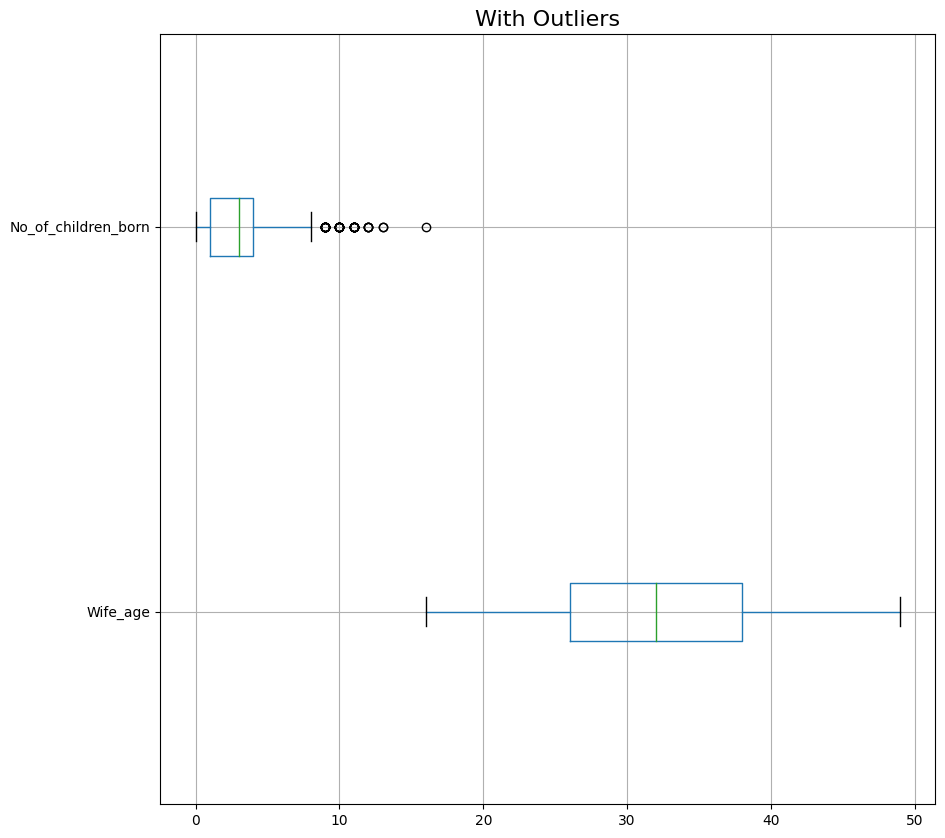

In [40]:
cont=df.dtypes[(df.dtypes!='int64') & (df.dtypes!='object')].index
plt.figure(figsize=(10,10))
df[cont].boxplot(vert=0)
plt.title('With Outliers',fontsize=16)
plt.show()

## From the boxplot above we found out that there are outliers in the column no. of children born.

## Treatment of outliers

In [41]:
def remove_outlier(col):
    sorted(col)
    Q1,Q3=np.percentile(col,[25,75])
    IQR=Q3-Q1
    lower_range= Q1-(1.5 * IQR)
    upper_range= Q3+(1.5 * IQR)
    return lower_range, upper_range

In [42]:
for column in df[cont].columns:
    lr,ur=remove_outlier(df[column])
    df[column]=np.where(df[column]>ur,ur,df[column])
    df[column]=np.where(df[column]<lr,lr,df[column])

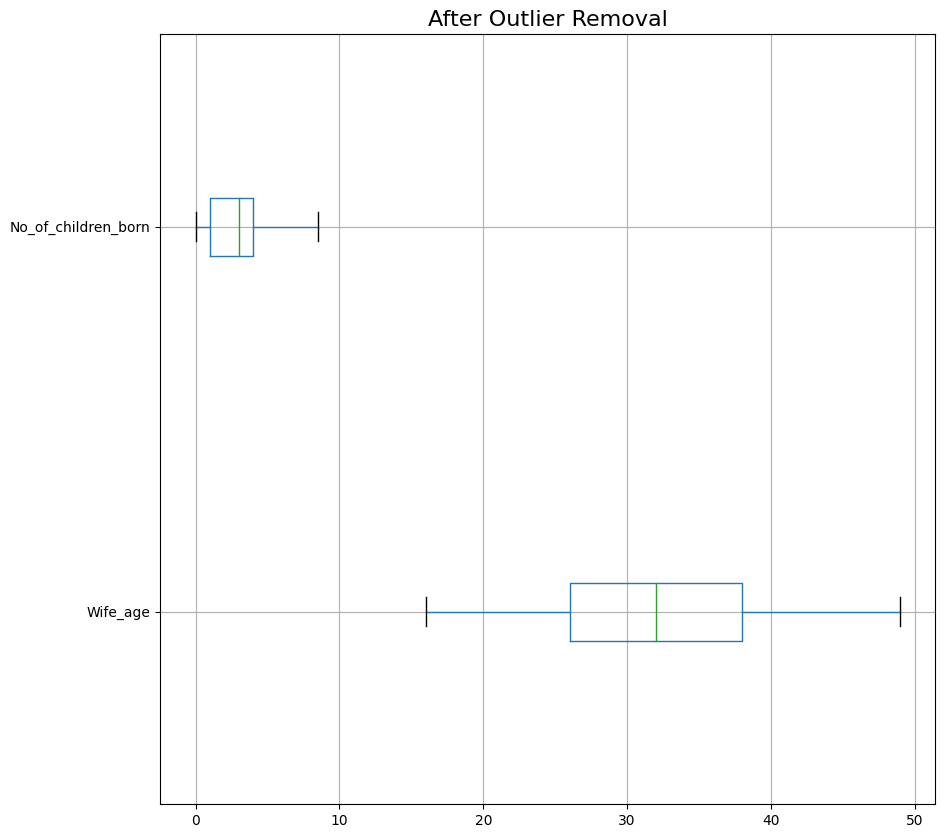

In [43]:
plt.figure(figsize=(10,10))
df[cont].boxplot(vert=0)
plt.title('After Outlier Removal',fontsize=16)
plt.show()

## The outliers have been treated

### **Univarient Analysis**

In [44]:
for column in df.columns:
    if df[column].dtype == 'object':
        print(column.upper(),': ',df[column].nunique())
        print(df[column].value_counts().sort_values())
        print('\n')

WIFE_ EDUCATION :  4
Uneducated    152
Primary       334
Secondary     410
Tertiary      577
Name: Wife_ education, dtype: int64


HUSBAND_EDUCATION :  4
Uneducated     44
Primary       178
Secondary     352
Tertiary      899
Name: Husband_education, dtype: int64


WIFE_RELIGION :  2
Non-Scientology     220
Scientology        1253
Name: Wife_religion, dtype: int64


WIFE_WORKING :  2
Yes     369
No     1104
Name: Wife_Working, dtype: int64


STANDARD_OF_LIVING_INDEX :  4
Very Low     129
Low          229
High         431
Very High    684
Name: Standard_of_living_index, dtype: int64


MEDIA_EXPOSURE  :  2
Not-Exposed     109
Exposed        1364
Name: Media_exposure , dtype: int64


CONTRACEPTIVE_METHOD_USED :  2
No     629
Yes    844
Name: Contraceptive_method_used, dtype: int64




### **Bivarient analysis**

<ipython-input-45-1ceec3b36e78>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_matrix = df.corr()


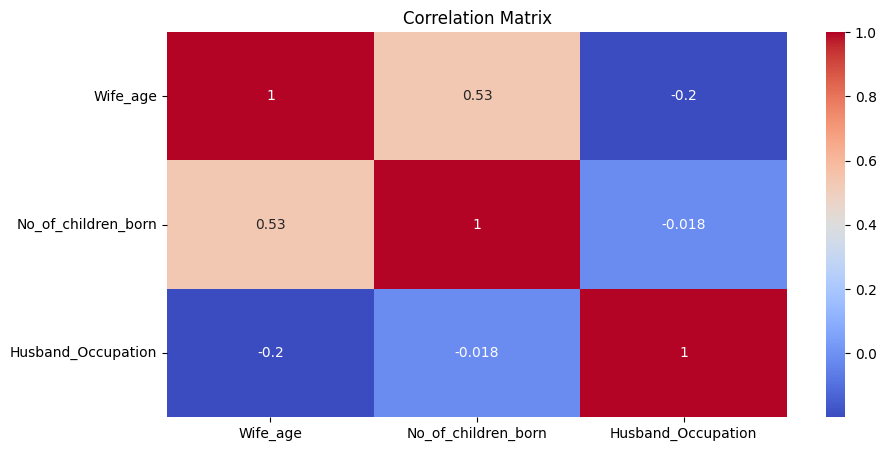

In [45]:
correlation_matrix = df.corr()
plt.figure(figsize=(10, 5))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm")
plt.title("Correlation Matrix")
plt.show()

## From the correlation plot we can clearly see that wife_age and no_of_children have a correlation between them.
## There is no correlation between  wige_age and husband_occupation  and between husband_occupation and no_of_children_born.

### **Multivarient analysis**

<Figure size 4000x2000 with 0 Axes>

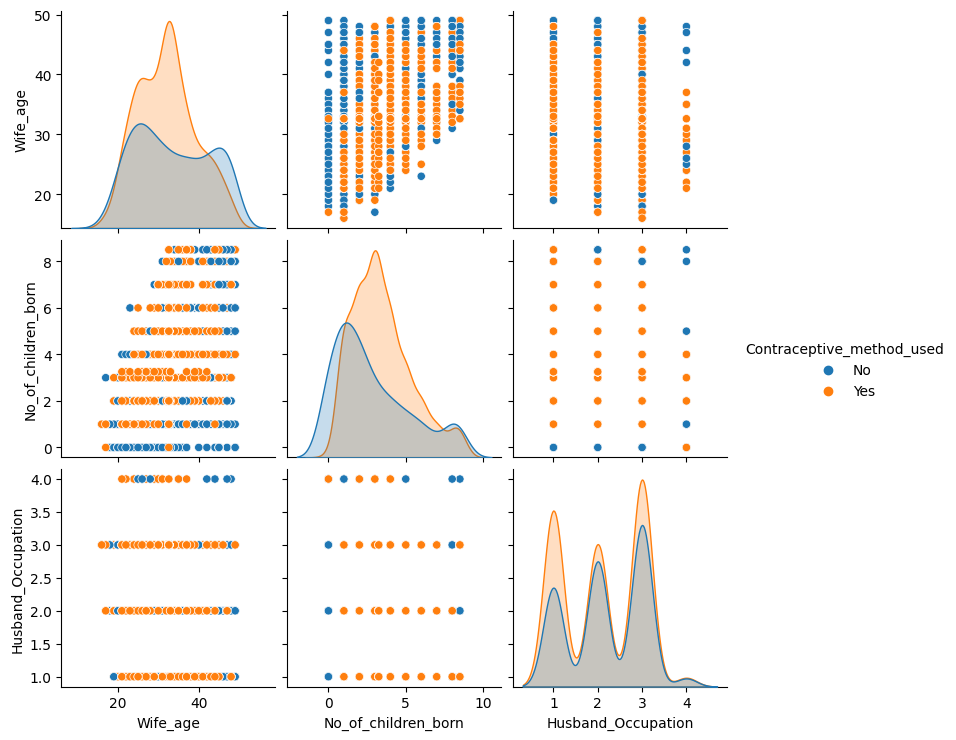

In [46]:
plt.figure(figsize=(40, 20))
sns.pairplot(df, hue="Contraceptive_method_used")
plt.show()

# Question 2.2 Do not scale the data. Encode the data (having string values) for Modelling. Data Split: Split the data into train and test (70:30). Apply Logistic Regression and LDA (linear discriminant analysis) and CART.

## Converting all the onject variables to integer datatypes

In [47]:
for column in df.columns:
    if df[column].dtype != 'object':
        mean = df[column].mean()
        df[column] = df[column].fillna(mean)

In [48]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1473 entries, 0 to 1472
Data columns (total 10 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Wife_age                   1473 non-null   float64
 1   Wife_ education            1473 non-null   object 
 2   Husband_education          1473 non-null   object 
 3   No_of_children_born        1473 non-null   float64
 4   Wife_religion              1473 non-null   object 
 5   Wife_Working               1473 non-null   object 
 6   Husband_Occupation         1473 non-null   int64  
 7   Standard_of_living_index   1473 non-null   object 
 8   Media_exposure             1473 non-null   object 
 9   Contraceptive_method_used  1473 non-null   object 
dtypes: float64(2), int64(1), object(7)
memory usage: 115.2+ KB


In [57]:
df_encoded = pd.get_dummies(df, columns=['Wife_ education', 'Wife_religion','Wife_Working','Media_exposure ','Contraceptive_method_used', 'Husband_education', 'Standard_of_living_index'], drop_first='True')

In [58]:
df_encoded.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1473 entries, 0 to 1472
Data columns (total 16 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   Wife_age                            1473 non-null   float64
 1   No_of_children_born                 1473 non-null   float64
 2   Husband_Occupation                  1473 non-null   int64  
 3   Wife_ education_Secondary           1473 non-null   uint8  
 4   Wife_ education_Tertiary            1473 non-null   uint8  
 5   Wife_ education_Uneducated          1473 non-null   uint8  
 6   Wife_religion_Scientology           1473 non-null   uint8  
 7   Wife_Working_Yes                    1473 non-null   uint8  
 8   Media_exposure _Not-Exposed         1473 non-null   uint8  
 9   Contraceptive_method_used_Yes       1473 non-null   uint8  
 10  Husband_education_Secondary         1473 non-null   uint8  
 11  Husband_education_Tertiary          1473 no

In [59]:
df_encoded.head(5)

,Wife_age,No_of_children_born,Husband_Occupation,Wife_ education_Secondary,Wife_ education_Tertiary,Wife_ education_Uneducated,Wife_religion_Scientology,Wife_Working_Yes,Media_exposure _Not-Exposed,Contraceptive_method_used_Yes,Husband_education_Secondary,Husband_education_Tertiary,Husband_education_Uneducated,Standard_of_living_index_Low,Standard_of_living_index_Very High,Standard_of_living_index_Very Low
0,24.0,3.0,2,0,0,0,1,0,0,0,1,0,0,0,0,0
1,45.0,8.5,3,0,0,1,1,0,0,0,1,0,0,0,1,0
2,43.0,7.0,3,0,0,0,1,0,0,0,1,0,0,0,1,0
3,42.0,8.5,3,1,0,0,1,0,0,0,0,0,0,0,0,0
4,36.0,8.0,3,1,0,0,1,0,0,0,1,0,0,1,0,0


In [61]:
df_encoded.columns

Index(['Wife_age', 'No_of_children_born', 'Husband_Occupation',
       'Wife_ education_Secondary', 'Wife_ education_Tertiary',
       'Wife_ education_Uneducated', 'Wife_religion_Scientology',
       'Wife_Working_Yes', 'Media_exposure _Not-Exposed',
       'Contraceptive_method_used_Yes', 'Husband_education_Secondary',
       'Husband_education_Tertiary', 'Husband_education_Uneducated',
       'Standard_of_living_index_Low', 'Standard_of_living_index_Very High',
       'Standard_of_living_index_Very Low'],
      dtype='object')

In [64]:

# Split the data into train and test (70:30)
from sklearn.model_selection import train_test_split

X = df_encoded.drop('Contraceptive_method_used_Yes', axis=1)
y = df_encoded['Contraceptive_method_used_Yes']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Apply Logistic Regression
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report

logistic_model = LogisticRegression(max_iter=10000)
logistic_model.fit(X_train, y_train)
logistic_predictions = logistic_model.predict(X_test)
logistic_accuracy = accuracy_score(y_test, logistic_predictions)

# Apply Linear Discriminant Analysis (LDA)
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

lda_model = LinearDiscriminantAnalysis()
lda_model.fit(X_train, y_train)
lda_predictions = lda_model.predict(X_test)
lda_accuracy = accuracy_score(y_test, lda_predictions)

# Apply CART (Decision Tree)
from sklearn.tree import DecisionTreeClassifier

cart_model = DecisionTreeClassifier()
cart_model.fit(X_train, y_train)
cart_predictions = cart_model.predict(X_test)
cart_accuracy = accuracy_score(y_test, cart_predictions)

# Model Evaluation
print("Logistic Regression Accuracy:", logistic_accuracy)
print("LDA Accuracy:", lda_accuracy)
print("CART Accuracy:", cart_accuracy)

# Classification Reports
print("Logistic Regression Classification Report:")
print(classification_report(y_test, logistic_predictions))

print("LDA Classification Report:")
print(classification_report(y_test, lda_predictions))

print("CART Classification Report:")
print(classification_report(y_test, cart_predictions))


Logistic Regression Accuracy: 0.6787330316742082
LDA Accuracy: 0.6742081447963801
CART Accuracy: 0.7036199095022625
Logistic Regression Classification Report:
              precision    recall  f1-score   support

           0       0.70      0.47      0.56       194
           1       0.67      0.84      0.75       248

    accuracy                           0.68       442
   macro avg       0.68      0.66      0.65       442
weighted avg       0.68      0.68      0.67       442

LDA Classification Report:
              precision    recall  f1-score   support

           0       0.70      0.45      0.55       194
           1       0.66      0.85      0.74       248

    accuracy                           0.67       442
   macro avg       0.68      0.65      0.65       442
weighted avg       0.68      0.67      0.66       442

CART Classification Report:
              precision    recall  f1-score   support

           0       0.65      0.71      0.68       194
           1       0.75

# Question 2.3:-Performance Metrics: Check the performance of Predictions on Train and Test sets using Accuracy, Confusion Matrix, Plot ROC curve and get ROC_AUC score for each model Final Model: Compare Both the models and write inference which model is best/optimized.

In [66]:
X_train.head()

,Wife_age,Wife_ education,Husband_education,No_of_children_born,Wife_religion,Wife_Working,Husband_Occupation,Standard_of_living_index,Media_exposure
998,36.0,Primary,Tertiary,8.500000,Scientology,No,1,Very High,Not-Exposed
254,48.0,Uneducated,Secondary,4.000000,Scientology,No,3,High,Not-Exposed
1074,38.0,Uneducated,Primary,8.000000,Scientology,No,3,High,Not-Exposed
643,27.0,Primary,Primary,5.000000,Scientology,No,3,Very Low,Exposed
1452,26.0,Secondary,Primary,3.254132,Scientology,No,3,Very High,Exposed


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


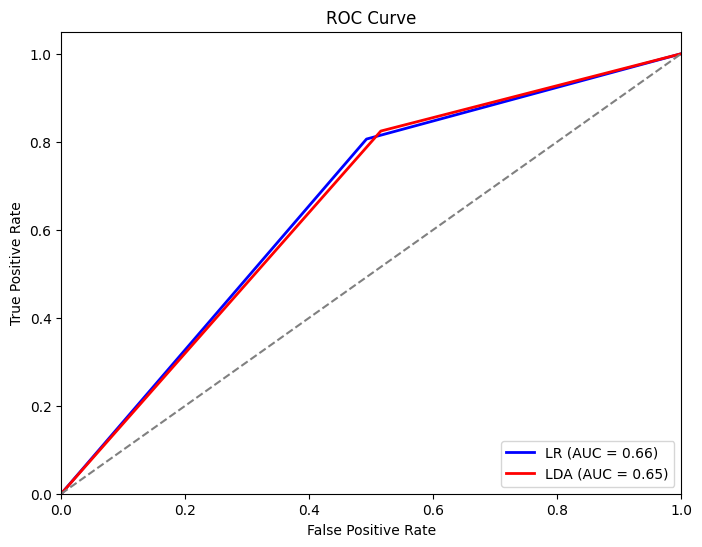

Both models perform equally well.


In [68]:
from sklearn.metrics import accuracy_score, confusion_matrix, roc_curve, roc_auc_score
import matplotlib.pyplot as plt

# Split the data into train and test sets
X = df_encoded.drop('Contraceptive_method_used_Yes', axis=1)
y = df_encoded['Contraceptive_method_used_Yes']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Fit the Logistic Regression model
lr_model = LogisticRegression()
lr_model.fit(X_train, y_train)

# Fit the Linear Discriminant Analysis model
lda_model = LinearDiscriminantAnalysis()
lda_model.fit(X_train, y_train)

# Make predictions
lr_predictions = lr_model.predict(X_test)
lda_predictions = lda_model.predict(X_test)

# Calculate accuracy for both models
lr_accuracy = accuracy_score(y_test, lr_predictions)
lda_accuracy = accuracy_score(y_test, lda_predictions)

# Create confusion matrices for both models
lr_confusion_matrix = confusion_matrix(y_test, lr_predictions)
lda_confusion_matrix = confusion_matrix(y_test, lda_predictions)

# Calculate ROC curve and AUC for both models
fpr_lr, tpr_lr, _ = roc_curve(y_test, lr_predictions)
roc_auc_lr = roc_auc_score(y_test, lr_predictions)

fpr_lda, tpr_lda, _ = roc_curve(y_test, lda_predictions)
roc_auc_lda = roc_auc_score(y_test, lda_predictions)

# Plot ROC curves
plt.figure(figsize=(8, 6))
plt.plot(fpr_lr, tpr_lr, color='blue', lw=2, label=f'LR (AUC = {roc_auc_lr:.2f})')
plt.plot(fpr_lda, tpr_lda, color='red', lw=2, label=f'LDA (AUC = {roc_auc_lda:.2f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc='lower right')
plt.show()

# Compare the models and write an inference
if lr_accuracy > lda_accuracy:
    print("Logistic Regression model performs better.")
elif lda_accuracy > lr_accuracy:
    print("Linear Discriminant Analysis model performs better.")
else:
    print("Both models perform equally well.")


# Question 2.4:- Inference: Basis on these predictions, what are the insights and recommendations. Please explain and summarise the various steps performed in this project. There should be proper business interpretation and actionable insights present.

### Model Accuracy

1. **Logistic Regression**: Achieved an accuracy of 67.87%.

2. **LDA (Linear Discriminant Analysis)**: Achieved an accuracy of 67.42%.

3. **CART (Classification and Regression Trees)**: Outperformed the others with an accuracy of 70.36%

4. ### Business Interpretation

   - The choice of model should align with the specific business goals and requirements.

   - CART offers a robust solution for our predictive tasks and should be considered for deployment.

   - The interpretability of the model should be considered, especially if stakeholders require insights into the factors driving the predictions.

     Conclusion

     The choice of model is pivotal for successful predictions, and it should be aligned with the specific business context. In this evaluation, the Classification and Regression Trees (CART) model demonstrated the highest accuracy and balanced performance. We recommend further refinement and testing of this model for deployment.

     The insights and recommendations presented in this report are designed to guide decision-making and enhance the effectiveness of predictive tasks. However, it's essential to consider domain knowledge and specific business requirements when making final decisions.